In [1]:
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import display, HTML
import numpy as np
import pandas as pd

In [2]:
ds = xr.open_dataset('erdSW1chlamday_bcf2_d589_926a.nc')

In [3]:
ds

<xarray.Dataset>
Dimensions:      (time: 96, latitude: 241, longitude: 241)
Coordinates:
  * time         (time) datetime64[ns] 1998-01-16 1998-02-16 ... 2005-12-16
  * latitude     (latitude) float32 25.04 24.96 24.87 ... 5.208 5.125 5.042
  * longitude    (longitude) float32 59.96 60.04 60.13 ... 79.79 79.88 79.96
Data variables:
    chlorophyll  (time, latitude, longitude) float32 ...
Attributes: (12/49)
    _lastModified:                     2015-10-02T00:07:51.000Z
    cdm_data_type:                     Grid
    Conventions:                       CF-1.6, COARDS, ACDD-1.3
    creator_email:                     data@oceancolor.gsfc.nasa.gov
    creator_name:                      NASA/GSFC/OBPG
    creator_type:                      group
    ...                                ...
    summary:                           THIS VERSION IS DEPRECATED. SEE THE NE...
    temporal_range:                    month
    time_coverage_end:                 2005-12-16T00:00:00Z
    time_coverage_start:               1998-01-16T00:00:00Z
    title:                             Chlorophyll-a, Orbview-2 SeaWiFS, R201...
    Westernmost_Easting:               59.95834

In [41]:
chl = ds2.chlorophyll

In [42]:
chl_min = chl.min() # minimum value in the data variable
chl_max = chl.max() # max value in the data variable

In [43]:
chl

<xarray.DataArray 'chlorophyll' (time: 180, latitude: 481, longitude: 481)>
array([[[ 1.841958,  1.966512, ...,       nan,       nan],
        [ 2.444986,  1.450643, ...,       nan,       nan],
        ...,
        [ 0.342905,  0.349452, ...,  0.234227,  0.243113],
        [ 0.33306 ,  0.333373, ...,  0.231635,  0.241988]],

       [[10.365654,  8.345677, ...,       nan,       nan],
        [ 4.804554,  6.830692, ...,       nan,       nan],
        ...,
        [ 0.291191,  0.280214, ...,  0.166654,  0.490177],
        [ 0.311918,  0.364726, ...,  0.473677,  0.502965]],

       ...,

       [[ 0.698452,  0.686735, ...,       nan,       nan],
        [ 0.681788,  0.702481, ...,       nan,       nan],
        ...,
        [ 0.1899  ,  0.191588, ...,  0.217436,  0.264054],
        [ 0.19677 ,  0.2046  , ...,  0.237326,  0.232656]],

       [[ 1.463541,  1.369486, ...,       nan,       nan],
        [ 1.339674,  1.348604, ...,       nan,       nan],
        ...,
        [ 0.229554,  0.226036, ...,  0.404899,  0.402529],
        [ 0.229554,  0.234416, ...,  0.406308,  0.434399]]], dtype=float32)
Coordinates:
  * time       (time) datetime64[ns] 2006-01-16 2006-02-16 ... 2020-12-16
  * latitude   (latitude) float32 25.02 24.98 24.94 24.9 ... 5.104 5.062 5.021
  * longitude  (longitude) float32 59.98 60.02 60.06 60.1 ... 79.9 79.94 79.98
Attributes:
    colorBarMaximum:  30.0
    colorBarMinimum:  0.03
    colorBarScale:    Log
    ioos_category:    Ocean Color
    long_name:        Mean Chlorophyll a Concentration
    references:       Hu, C., Lee Z., and Franz, B.A. (2012). Chlorophyll-a a...
    standard_name:    concentration_of_chlorophyll_in_sea_water
    units:            mg m-3
    valid_max:        100.0
    valid_min:        0.001

In [44]:
len(chl)

180

In [45]:
def show_time_step(i):
    # clear current figure to show next figure
    plt.clf()
    # make sure plot use the same color scale for consistency
    res = chl[i].plot.imshow(vmin=chl_min, vmax=chl_max)
    return (res,)

In [46]:
# get 96 frames of the animation

anim = animation.FuncAnimation(plt.gcf(), func=show_time_step, frames=len(chl))

# display animation
display(HTML(anim.to_jshtml()))
plt.close()

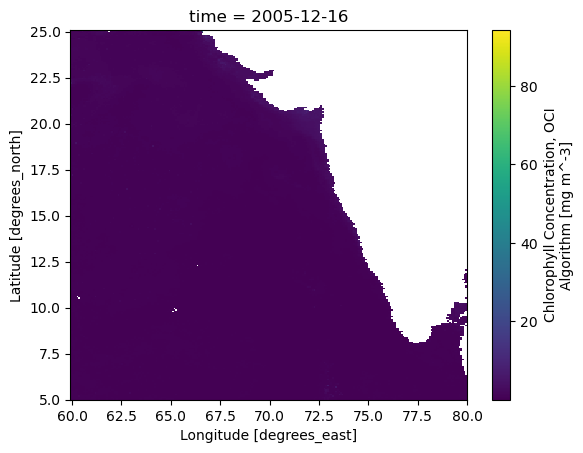

In [20]:
writervideo = animation.FFMpegWriter(fps=60)
anim.save('chlorophyll.mp4', writer=writervideo)

In [ ]:
display(HTML(anim.to_jshtml()))
plt.close()

In [14]:
start = pd.to_datetime('2006-01-01')
start + np.timedelta64(1, 'M')

for i in range(len(chl)):
    day = start + np.timedelta64(i, 'M')
    t = chl[i].plot.imshow(vmin=chl_min, vmax=chl_max)
    t = t.figure
    t.delaxes(t.axes[1])
    plt.axis('off')
    plt.title('')
    plt.savefig(f"chlorophyll-a/{day.strftime('%Y-%m')}.png", bbox_inches='tight')
    plt.clf()

<Figure size 640x480 with 0 Axes>

In [13]:
chl = xr.open_dataset('chlorophyll-2.nc').chlorophyll

In [15]:
chl.mean()

<xarray.DataArray 'chlorophyll' ()>
array(0.70506597, dtype=float32)

In [16]:
chl.max()

<xarray.DataArray 'chlorophyll' ()>
array(99.88898, dtype=float32)

In [17]:
chl.min()

<xarray.DataArray 'chlorophyll' ()>
array(0.035817, dtype=float32)

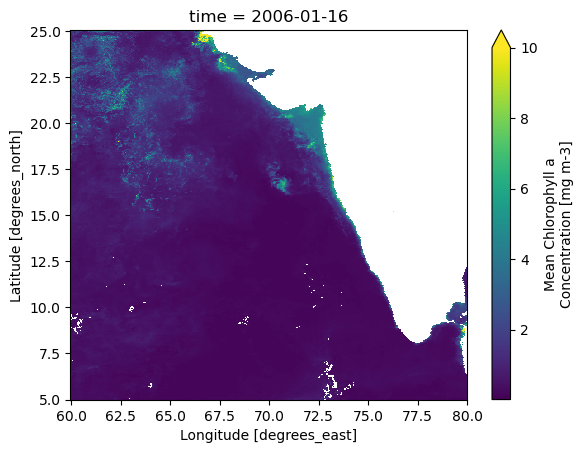

In [19]:
chl[0].plot.imshow(vmin=chl_min, vmax=10)

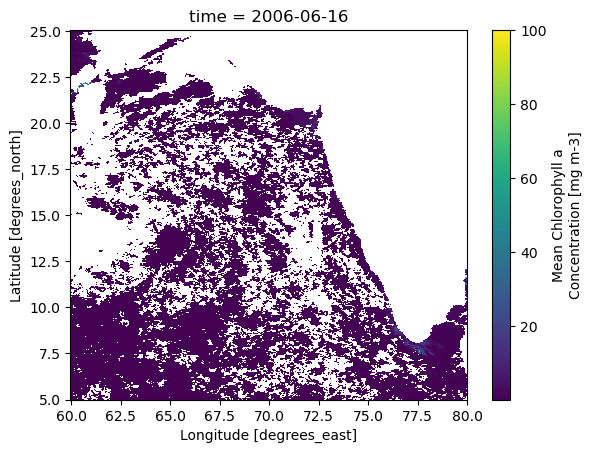

In [23]:
chl[5].plot.imshow(vmin=chl_min, vmax=100)

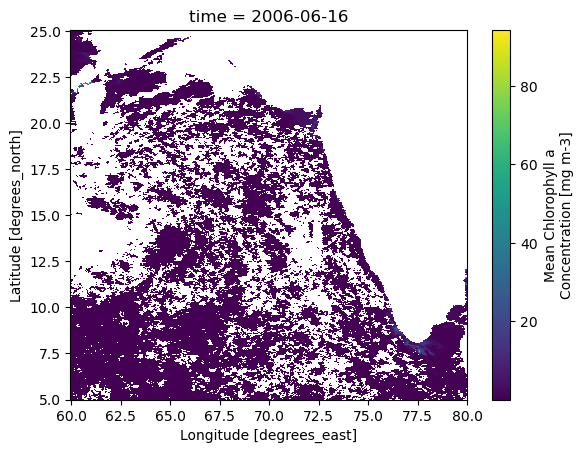

In [21]:
chl[5].plot.imshow(vmin=chl_min, vmax=chl_max)

In [4]:
xr.open_dataset('chlorophyll-2.nc')

<xarray.Dataset>
Dimensions:      (time: 180, latitude: 481, longitude: 481)
Coordinates:
  * time         (time) datetime64[ns] 2006-01-16 2006-02-16 ... 2020-12-16
  * latitude     (latitude) float32 25.02 24.98 24.94 24.9 ... 5.104 5.062 5.021
  * longitude    (longitude) float32 59.98 60.02 60.06 60.1 ... 79.9 79.94 79.98
Data variables:
    chlorophyll  (time, latitude, longitude) float32 ...
Attributes: (12/51)
    _lastModified:                     2022-06-18T05:03:50.000Z
    cdm_data_type:                     Grid
    Conventions:                       CF-1.6, COARDS, ACDD-1.3
    creator_email:                     data@oceancolor.gsfc.nasa.gov
    creator_name:                      NASA/GSFC/OBPG
    creator_type:                      group
    ...                                ...
    temporal_range:                    month
    testOutOfDate:                     now-90days
    time_coverage_end:                 2020-12-16T00:00:00Z
    time_coverage_start:               2006-01-16T00:00:00Z
    title:                             Chlorophyll-a, Aqua MODIS, NPP, L3SMI,...
    Westernmost_Easting:               59.979176

In [7]:
chloro = xr.open_mfdataset(['erdSW1chlamday_bcf2_d589_926a.nc', 'chlorophyll-2.nc'])

ValueError: Resulting object does not have monotonic global indexes along dimension longitude

In [3]:
ds2=xr.open_dataset('chlorophyll-2.nc')

In [4]:
ds2.mean(['latitude', 'longitude'], skipna=True)

<xarray.Dataset>
Dimensions:      (time: 180)
Coordinates:
  * time         (time) datetime64[ns] 2006-01-16 2006-02-16 ... 2020-12-16
Data variables:
    chlorophyll  (time) float32 0.7438 1.178 0.5761 ... 0.7087 0.5766 0.6245

In [5]:
ds.mean(['latitude', 'longitude'], skipna=True)

<xarray.Dataset>
Dimensions:      (time: 96)
Coordinates:
  * time         (time) datetime64[ns] 1998-01-16 1998-02-16 ... 2005-12-16
Data variables:
    chlorophyll  (time) float32 0.4228 0.473 0.4091 ... 0.6446 0.5324 0.62

In [9]:
ds

<xarray.Dataset>
Dimensions:      (time: 96, latitude: 241, longitude: 241)
Coordinates:
  * time         (time) datetime64[ns] 1998-01-16 1998-02-16 ... 2005-12-16
  * latitude     (latitude) float32 25.04 24.96 24.87 ... 5.208 5.125 5.042
  * longitude    (longitude) float32 59.96 60.04 60.13 ... 79.79 79.88 79.96
Data variables:
    chlorophyll  (time, latitude, longitude) float32 ...
Attributes: (12/49)
    _lastModified:                     2015-10-02T00:07:51.000Z
    cdm_data_type:                     Grid
    Conventions:                       CF-1.6, COARDS, ACDD-1.3
    creator_email:                     data@oceancolor.gsfc.nasa.gov
    creator_name:                      NASA/GSFC/OBPG
    creator_type:                      group
    ...                                ...
    summary:                           THIS VERSION IS DEPRECATED. SEE THE NE...
    temporal_range:                    month
    time_coverage_end:                 2005-12-16T00:00:00Z
    time_coverage_start:               1998-01-16T00:00:00Z
    title:                             Chlorophyll-a, Orbview-2 SeaWiFS, R201...
    Westernmost_Easting:               59.95834

In [24]:
time = np.append(ds.time.values.flatten(),ds2.time.values.flatten())

In [23]:
chl_vals = np.append(ds.mean(['latitude', 'longitude'])['chlorophyll'].values, ds2.mean(['latitude', 'longitude'])['chlorophyll'].values)

In [33]:
avg_chls = xr.DataArray(data=chl_vals,
                        dims=['time'],
                       coords=dict(time=time))

In [27]:
time.shape

(276,)

In [29]:
chl_vals.shape

(276,)

In [34]:
avg_chls.time

<xarray.DataArray 'time' (time: 276)>
array(['1998-01-16T00:00:00.000000000', '1998-02-16T00:00:00.000000000',
       '1998-03-16T00:00:00.000000000', ..., '2020-10-16T00:00:00.000000000',
       '2020-11-16T00:00:00.000000000', '2020-12-16T00:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 1998-01-16 1998-02-16 ... 2020-12-16

In [38]:
avg_chls.to_dataframe(name='avg_area_chl').to_csv('avg_chls.csv')

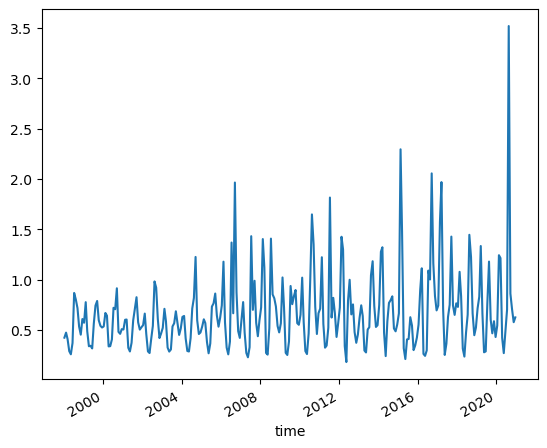

In [40]:
avg_chls.plot()